# GRUPO 2: Iván Loza, Johnny Liao y Álvaro Iglesias

In [240]:
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3
import csv
from google.colab import drive
import networkx as nx
import seaborn as sns
import numpy as np
import sqlite3
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn import svm
from sklearn.metrics import accuracy_score, classification_report
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
drive.mount('/content/drive')



In [241]:
#Iván
# df_cloudiness = pd.read_csv("/content/drive/MyDrive/CSV_Máster_Inteligencia_Artificial/cloudiness.csv")
# df_dates = pd.read_csv("/content/drive/MyDrive/Master IA/Big_data/datos_prediccion/dates.csv")
# df_observations = pd.read_csv("/content/drive/MyDrive/Master IA/Big_data/datos_prediccion/observations.csv")
# df_weather = pd.read_csv("/content/drive/MyDrive/Master IA/Big_data/datos_prediccion/weather.csv")
# df_seasons = pd.read_csv("/content/drive/MyDrive/Master IA/Big_data/datos_prediccion/seasons.csv")

#Álvaro y Johnny
df_cloudiness = pd.read_csv("/content/drive/MyDrive/Master IA/Big_data/Proyecto3/cloudiness.csv")
df_observations = pd.read_csv("/content/drive/MyDrive/Master IA/Big_data/Proyecto3/observations.csv")
df_weather = pd.read_csv("/content/drive/MyDrive/Master IA/Big_data/Proyecto3/weather.csv")
df_seasons = pd.read_csv("/content/drive/MyDrive/Master IA/Big_data/Proyecto3/seasons.csv")
df_dates = pd.read_csv("/content/drive/MyDrive/Master IA/Big_data/Proyecto3/dates.csv")

#Álvaro PC Personal
# df_cloudiness = pd.read_csv("cloudiness.csv")
# df_observations = pd.read_csv("observations.csv")
# df_weather = pd.read_csv("weather.csv")
# df_seasons = pd.read_csv("seasons.csv")
# df_dates = pd.read_csv("dates.csv")



In [242]:
from google.colab import drive
drive.mount('/content/drive')

In [243]:
# Contar los nulos por columna en df_cloudiness
nulos_por_columna = df_cloudiness.isnull().sum()
print("NULOS:")
print(nulos_por_columna)

#Contar el número de cantidades repetidas
print("DUPLICADOS:")
cantidades_repetidas = df_cloudiness['cloudiness'].value_counts()
print(cantidades_repetidas)

df_cloudiness.head(6)

NULOS:
cloudiness       0
cloudiness_id    0
dtype: int64
DUPLICADOS:
cloudiness
parcialmente nublado    1
despejado               1
cubierto                1
Name: count, dtype: int64


,cloudiness,cloudiness_id
0,parcialmente nublado,1
1,despejado,2
2,cubierto,3


In [244]:
# Contar los nulos por columna en df_cloudiness
nulos_por_columna = df_dates.isnull().sum()
print("NULOS:")
print(nulos_por_columna)

#Contar el número de cantidades repetidas
print("DUPLICADOS:")
cantidades_repetidas = df_dates['date'].value_counts()
print(cantidades_repetidas)

df_dates.head(6)

NULOS:
date       0
date_id    0
dtype: int64
DUPLICADOS:
date
2084-06-11    1
2016-01-01    1
2016-01-02    1
2016-01-03    1
2016-01-04    1
             ..
2016-01-12    1
2016-01-13    1
2016-01-14    1
2016-01-15    1
2016-01-16    1
Name: count, Length: 25000, dtype: int64


,date,date_id
0,2016-01-01,1
1,2016-01-02,2
2,2016-01-03,3
3,2016-01-04,4
4,2016-01-05,5
5,2016-01-06,6


In [245]:
# Contar los nulos por columna en df_weather
nulos_por_columna = df_weather.isnull().sum()
print("NULOS:")
print(nulos_por_columna)

#Contar el número de cantidades repetidas
print("DUPLICADOS:")
cantidades_repetidas = df_weather['weather'].value_counts()
print(cantidades_repetidas)

df_weather.head(6)

NULOS:
weather       0
weather_id    0
dtype: int64
DUPLICADOS:
weather
storm     1
rain      1
cloudy    1
fog       1
sun       1
Name: count, dtype: int64


,weather,weather_id
0,storm,1
1,rain,2
2,cloudy,3
3,fog,4
4,sun,5


In [246]:
#Contar los nulos que existen en la columnas en df_seasons
nulos_por_columna = df_seasons.isnull().sum()
print("NULOS:")
print(nulos_por_columna)

#Contar los duplicados que hay en los registros de df_seasons
print("DUPLICADOS:")
cantidades_repetidas = df_seasons['estacion_id'].value_counts()
print(cantidades_repetidas)

df_seasons.head(6)


NULOS:
estacion       0
estacion_id    0
dtype: int64
DUPLICADOS:
estacion_id
1    1
2    1
3    1
4    1
Name: count, dtype: int64


,estacion,estacion_id
0,Invierno,1
1,Primavera,2
2,Verano,3
3,Otoño,4


In [247]:
#Contar los nulos que existen en la columnas en df_observations
nulos_por_columna = df_observations.isnull().sum()
print("NULOS:")
print(nulos_por_columna)

#Contar los duplicados que hay en los registros de df_observations
print("DUPLICADOS:")
cantidades_repetidas = df_observations['date_id'].value_counts()
print(cantidades_repetidas)

df_observations.head(6)


NULOS:
date_id               0
precipitation      2500
temp_max           2500
temp_min           2500
wind               2500
humidity              0
pressure              0
solar_radiation       0
visibility            0
weather_id            0
cloudiness_id         0
estacion_id           0
dtype: int64
DUPLICADOS:
date_id
25000    1
1        1
2        1
3        1
4        1
        ..
12       1
13       1
14       1
15       1
16       1
Name: count, Length: 25000, dtype: int64


,date_id,precipitation,temp_max,temp_min,wind,humidity,pressure,solar_radiation,visibility,weather_id,cloudiness_id,estacion_id
0,1,44.599483,24.623334,14.194788,6.343068,72.164838,1047.159266,355.719260,2.554031,1,1,1
1,2,42.005045,5.424691,4.754055,1.965057,61.847605,1015.712275,320.128520,16.960026,2,1,1
2,3,40.041807,4.626002,2.752717,8.278839,70.867155,1032.346048,206.294226,5.264422,1,1,1
3,4,11.733310,33.900703,15.585794,4.369015,82.692741,1018.328973,340.829562,1.650444,2,1,1
4,5,NaN,NaN,NaN,NaN,93.495408,1040.779759,1171.100262,5.274300,3,2,1
5,6,16.171726,4.652273,0.362042,7.379241,52.770392,1005.365595,568.705854,17.483429,1,1,1


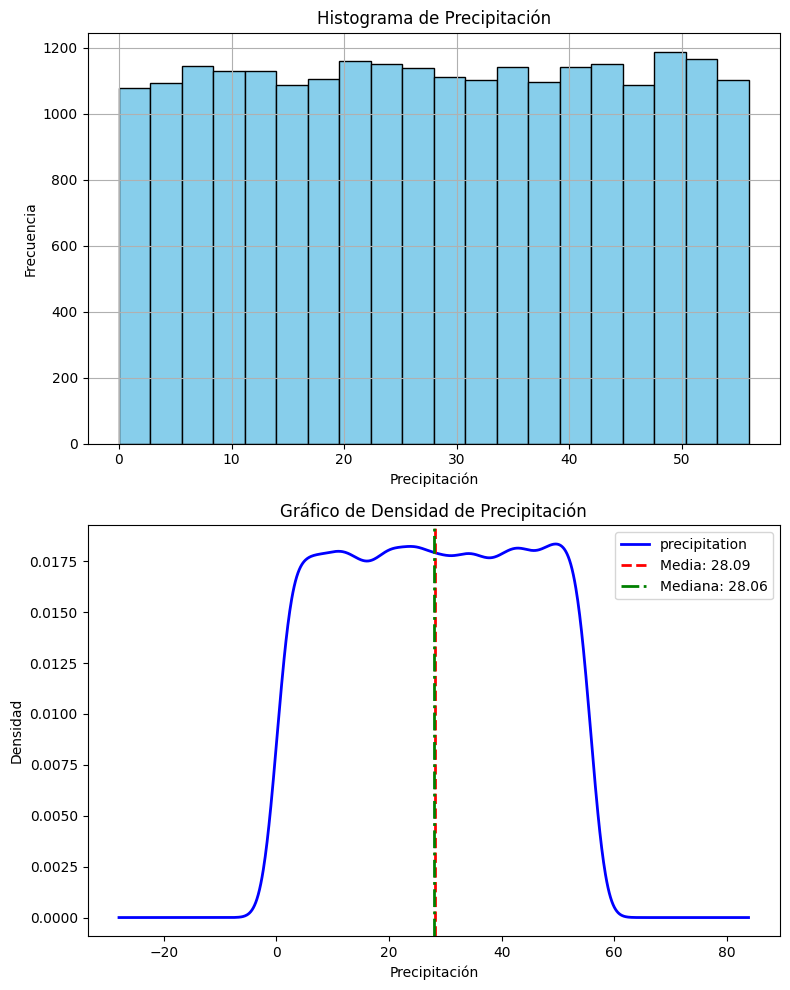

In [248]:
# Crear la figura y los subplots en una columna (2 filas, 1 columna)
fig, axs = plt.subplots(2, 1, figsize=(8, 10))

# Subplot 1: Histograma
df_observations['precipitation'].hist(bins=20, color='skyblue', edgecolor='black', ax=axs[0])
axs[0].set_title("Histograma de Precipitación")
axs[0].set_xlabel("Precipitación")
axs[0].set_ylabel("Frecuencia")

# Subplot 2: Gráfico de densidad con media y mediana
df_observations['precipitation'].plot(kind='kde', color='blue', linewidth=2, ax=axs[1])

# Calcular la media y la mediana
media = df_observations['precipitation'].mean()
mediana = df_observations['precipitation'].median()

# Añadir líneas verticales para la media y la mediana en el gráfico de densidad
axs[1].axvline(media, color='red', linestyle='--', linewidth=2, label=f'Media: {media:.2f}')
axs[1].axvline(mediana, color='green', linestyle='-.', linewidth=2, label=f'Mediana: {mediana:.2f}')

# Configurar el título y etiquetas del segundo subplot
axs[1].set_title("Gráfico de Densidad de Precipitación")
axs[1].set_xlabel("Precipitación")
axs[1].set_ylabel("Densidad")
axs[1].legend()

# Ajustar el espaciado entre subplots
plt.tight_layout()



In [249]:
#Rellenar los nulos con la media de la precipitacion en df_observations
df_observations['precipitation'].fillna(df_observations['precipitation'].mean(), inplace=True)

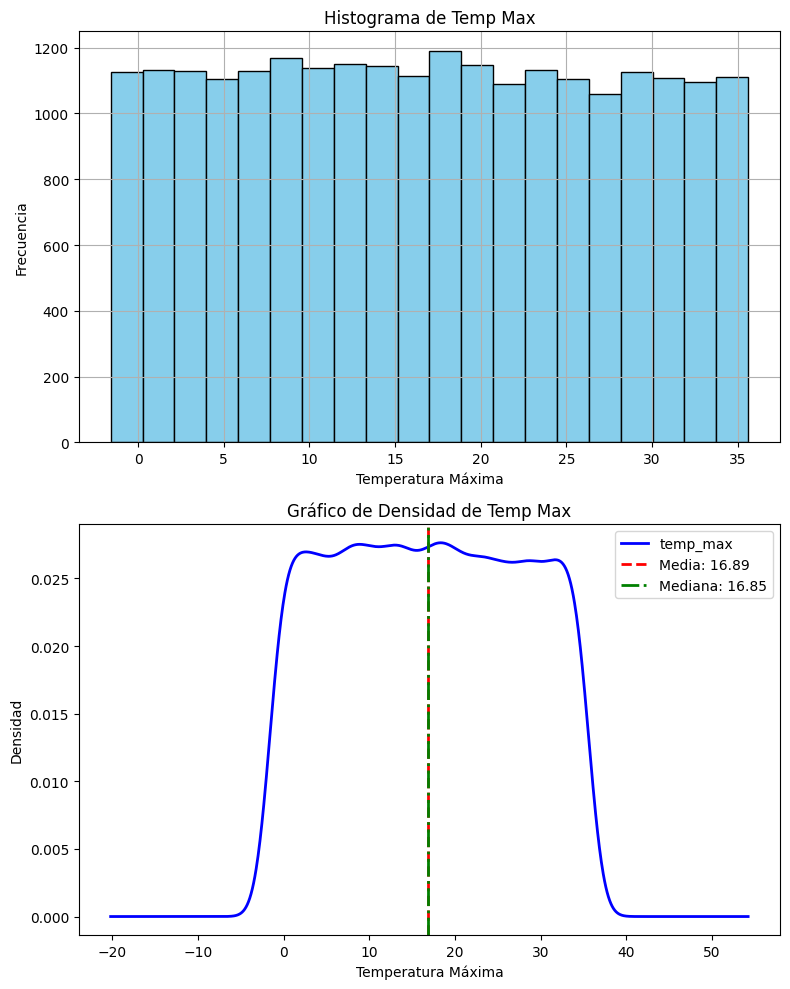

In [250]:
# Crear la figura y los subplots en una columna (2 filas, 1 columna)
fig, axs = plt.subplots(2, 1, figsize=(8, 10))

# Subplot 1: Histograma de temp_max
df_observations['temp_max'].hist(bins=20, color='skyblue', edgecolor='black', ax=axs[0])
axs[0].set_title("Histograma de Temp Max")
axs[0].set_xlabel("Temperatura Máxima")
axs[0].set_ylabel("Frecuencia")

# Subplot 2: Gráfico de densidad de temp_max con la media y mediana
df_observations['temp_max'].plot(kind='kde', color='blue', linewidth=2, ax=axs[1])

# Calcular la media y la mediana de temp_max
media_temp_max = df_observations['temp_max'].mean()
mediana_temp_max = df_observations['temp_max'].median()

# Añadir líneas verticales para la media y la mediana en el gráfico de densidad
axs[1].axvline(media_temp_max, color='red', linestyle='--', linewidth=2, label=f'Media: {media_temp_max:.2f}')
axs[1].axvline(mediana_temp_max, color='green', linestyle='-.', linewidth=2, label=f'Mediana: {mediana_temp_max:.2f}')

# Configurar el título y etiquetas del segundo subplot
axs[1].set_title("Gráfico de Densidad de Temp Max")
axs[1].set_xlabel("Temperatura Máxima")
axs[1].set_ylabel("Densidad")
axs[1].legend()

# Ajustar el espaciado entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()



In [251]:
#Debido a que la media y la mediana son parecidas hemos decidido usar la media ya que la distribución es similar a la normal
df_observations['temp_max'].fillna(df_observations['temp_max'].mean(), inplace=True)


Media de temp_min: 3.580655338596054
Mediana de temp_min: 2.735743094830525


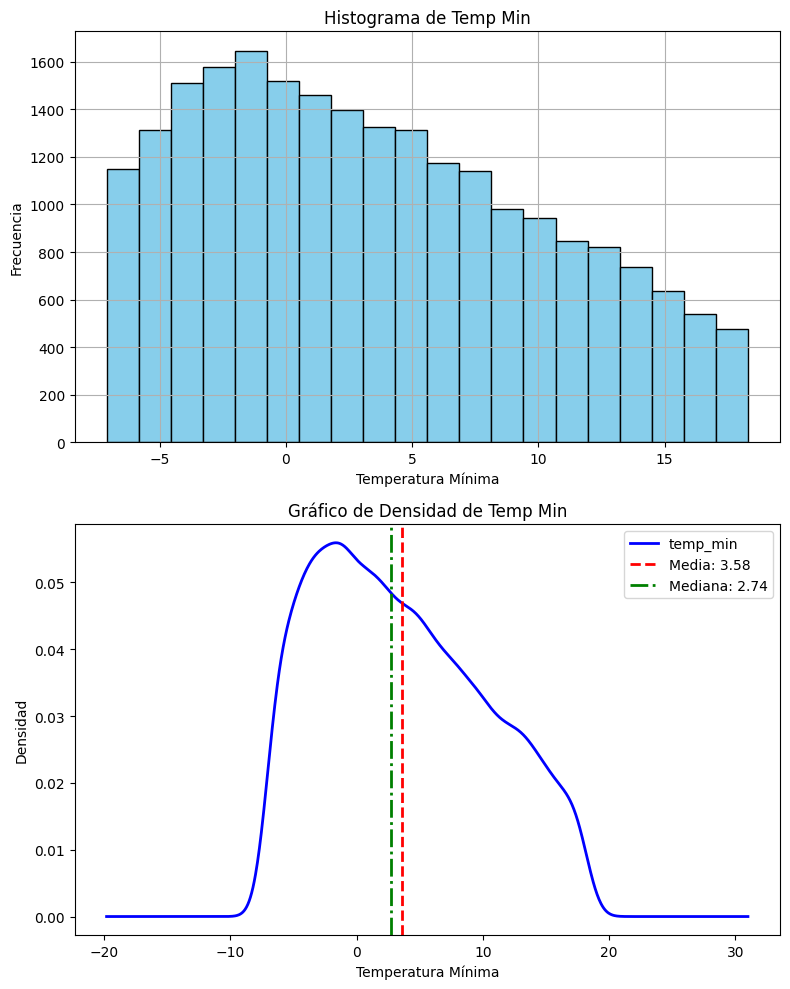

In [252]:
# Crear la figura y los subplots en una columna (2 filas, 1 columna)
fig, axs = plt.subplots(2, 1, figsize=(8, 10))

# Subplot 1: Histograma de temp_min
df_observations['temp_min'].hist(bins=20, color='skyblue', edgecolor='black', ax=axs[0])
axs[0].set_title("Histograma de Temp Min")
axs[0].set_xlabel("Temperatura Mínima")
axs[0].set_ylabel("Frecuencia")

# Calcular la media y la mediana de temp_min
media_temp_min = df_observations['temp_min'].mean()
mediana_temp_min = df_observations['temp_min'].median()

# Imprimir la media y la mediana
print("Media de temp_min:", media_temp_min)
print("Mediana de temp_min:", mediana_temp_min)

# Subplot 2: Gráfico de densidad de temp_min con la media y la mediana
df_observations['temp_min'].plot(kind='kde', color='blue', linewidth=2, ax=axs[1])

# Añadir líneas verticales para la media y la mediana en el gráfico de densidad
axs[1].axvline(media_temp_min, color='red', linestyle='--', linewidth=2, label=f'Media: {media_temp_min:.2f}')
axs[1].axvline(mediana_temp_min, color='green', linestyle='-.', linewidth=2, label=f'Mediana: {mediana_temp_min:.2f}')

# Configurar el título y etiquetas del segundo subplot
axs[1].set_title("Gráfico de Densidad de Temp Min")
axs[1].set_xlabel("Temperatura Mínima")
axs[1].set_ylabel("Densidad")
axs[1].legend()

# Ajustar el espaciado entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()


In [253]:
#Susituir los valores nulos en temp_min por la mediana ya que la distribución es asimétrica
df_observations['temp_min'].fillna(df_observations['temp_min'].median(), inplace=True)

Media de wind: 4.931800815971483
Mediana de wind: 4.915005060416275


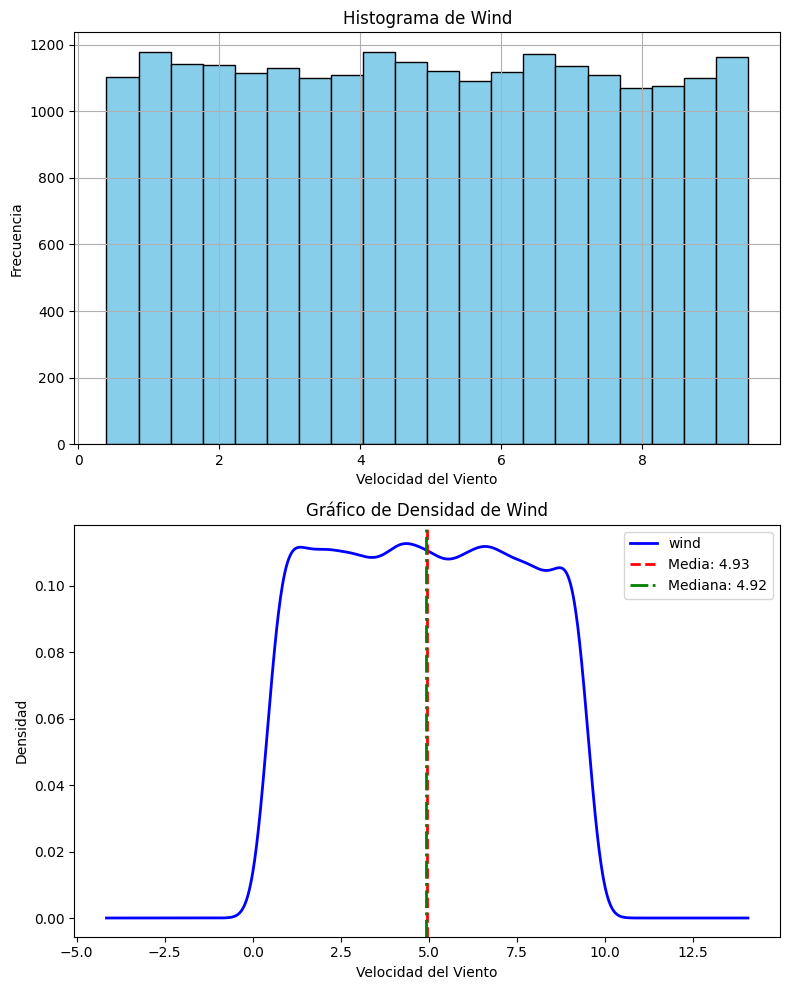

In [254]:
# Crear la figura y los subplots en una columna (2 filas, 1 columna)
fig, axs = plt.subplots(2, 1, figsize=(8, 10))

# Subplot 1: Histograma de wind
df_observations['wind'].hist(bins=20, color='skyblue', edgecolor='black', ax=axs[0])
axs[0].set_title("Histograma de Wind")
axs[0].set_xlabel("Velocidad del Viento")
axs[0].set_ylabel("Frecuencia")

# Calcular la media y la mediana de wind
media_wind = df_observations['wind'].mean()
mediana_wind = df_observations['wind'].median()

# Imprimir la media y la mediana
print("Media de wind:", media_wind)
print("Mediana de wind:", mediana_wind)

# Subplot 2: Gráfico de densidad de wind con la media y la mediana
df_observations['wind'].plot(kind='kde', color='blue', linewidth=2, ax=axs[1])

# Añadir líneas verticales para la media y la mediana en el gráfico de densidad
axs[1].axvline(media_wind, color='red', linestyle='--', linewidth=2, label=f'Media: {media_wind:.2f}')
axs[1].axvline(mediana_wind, color='green', linestyle='-.', linewidth=2, label=f'Mediana: {mediana_wind:.2f}')

# Configurar el título y etiquetas del segundo subplot
axs[1].set_title("Gráfico de Densidad de Wind")
axs[1].set_xlabel("Velocidad del Viento")
axs[1].set_ylabel("Densidad")
axs[1].legend()

# Ajustar el espaciado entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

In [255]:
#Susituir los valores nulos en wind por el promedio ya que la distribución es similar a la normal
df_observations['wind'].fillna(df_observations['wind'].mean(), inplace=True)

In [256]:
#Álvaro
db_path = 'observations.db'

#Google Colab
db_path = '/content/drive/MyDrive/Master IA/Big_data/Proyecto3/observations.db'  # Base de datos unificada
conn = sqlite3.connect(db_path)
cursor = conn.cursor()


# Crear la tabla 'dates'
cursor.execute('''
    CREATE TABLE IF NOT EXISTS dates (
        date_id INTEGER PRIMARY KEY,
        date TEXT NOT NULL
    )
''')

# Crear la tabla 'weather'
cursor.execute('''
    CREATE TABLE IF NOT EXISTS weather (
        weather_id INTEGER PRIMARY KEY,
        weather TEXT NOT NULL
    )
''')

cursor.execute('''
    CREATE TABLE IF NOT EXISTS cloudiness (
        cloudiness_id INTEGER PRIMARY KEY,
        cloudiness TEXT NOT NULL
    )
''')

cursor.execute('''
    CREATE TABLE IF NOT EXISTS seasons (
        estacion_id INTEGER PRIMARY KEY,
        estacion TEXT NOT NULL
    )
''')

# Crear la tabla 'weather'
cursor.execute('''
    CREATE TABLE IF NOT EXISTS weather_data (
        date_id INTEGER PRIMARY KEY,      -- Clave primaria
        precipitation REAL,               -- Precipitación
        temp_max REAL,                    -- Temperatura máxima
        temp_min REAL,                    -- Temperatura mínima
        wind REAL,                        -- Viento
        humidity REAL,                    -- Humedad
        pressure REAL,                    -- Presión
        solar_radiation REAL,             -- Radiación solar
        visibility REAL,                  -- Visibilidad
        weather_id INTEGER,               -- Clave foránea que referencia a weather
        cloudiness_id INTEGER,            -- Clave foránea que referencia a cloudiness
        estacion_id INTEGER,            -- Clave foránea que referencia a estación
        FOREIGN KEY (date_id) REFERENCES dates(date_id),
        FOREIGN KEY (weather_id) REFERENCES weather(weather_id),
        FOREIGN KEY (cloudiness_id) REFERENCES cloudiness(cloudiness_id),
        FOREIGN KEY (estacion_id) REFERENCES seasons(estacion_id)
    )
''')




In [257]:
# Insertar datos en la tabla 'cloudiness'
for _, row in df_cloudiness.iterrows():
    cursor.execute('''
        INSERT INTO cloudiness (cloudiness_id, cloudiness)
        VALUES (?, ?)
    ''', (row['cloudiness_id'], row['cloudiness']))

# Insertar datos en la tabla 'weather'
for _, row in df_weather.iterrows():
    cursor.execute('''
        INSERT INTO weather (weather_id, weather)
        VALUES (?, ?)
    ''', (row['weather_id'], row['weather']))

# Insertar datos en la tabla 'dates'
for _, row in df_dates.iterrows():
    cursor.execute('''
        INSERT INTO dates (date_id, date)
        VALUES (?, ?)
    ''', (row['date_id'], row['date']))

# Insertar datos en la tabla 'seasons'
for _, row in df_seasons.iterrows():
    cursor.execute('''
        INSERT INTO seasons (estacion_id, estacion)
        VALUES (?, ?)
    ''', (row['estacion_id'], row['estacion']))

# Insertar datos en la tabla 'weather_data'
for _, row in df_observations.iterrows():
    cursor.execute('''
        INSERT INTO weather_data (
            date_id, precipitation, temp_max, temp_min, wind, humidity,
            pressure, solar_radiation, visibility, weather_id, cloudiness_id, estacion_id
        ) VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)
    ''', (
        row['date_id'], row['precipitation'], row['temp_max'], row['temp_min'],
        row['wind'], row['humidity'], row['pressure'], row['solar_radiation'],
        row['visibility'], row['weather_id'], row['cloudiness_id'], row['estacion_id']
    ))

OperationalError: database is locked

In [140]:
#Guardar cambios en la base de datos
conn.commit()

In [141]:
#Descargar un csv de cada tabla de la base de datos
df_observations.to_csv('observations_new.csv', index=False)


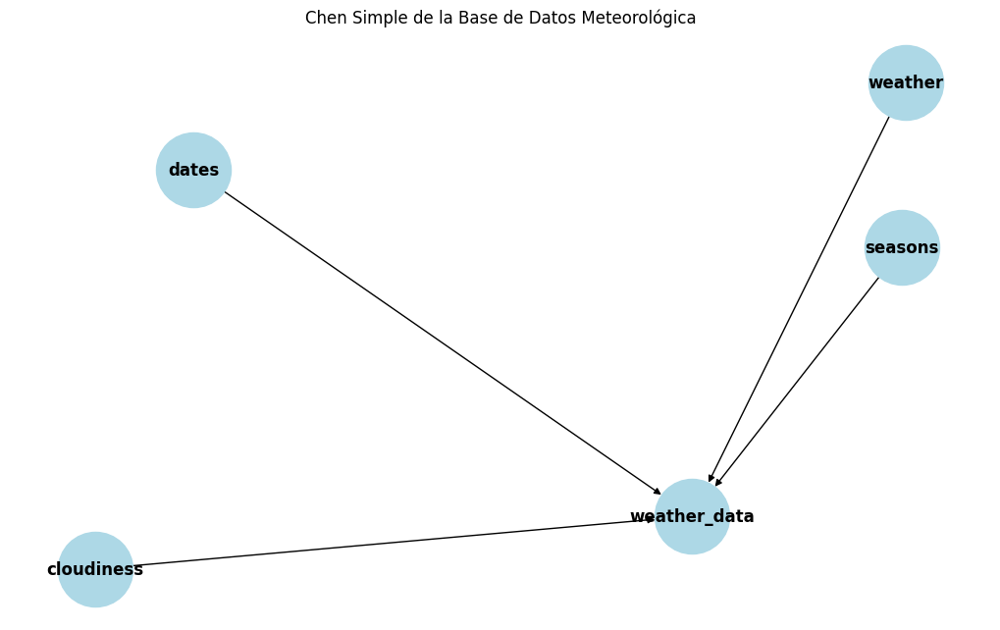

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Crear un grafo dirigido
G = nx.DiGraph()

# Agregar nodos (tablas)
tables = ['dates', 'weather', 'cloudiness', 'seasons', 'weather_data']
G.add_nodes_from(tables)

# Agregar relaciones (edges)
relationships = [
    ('weather', 'weather_data'),       # 'weather' se relaciona con 'weather_data'
    ('cloudiness', 'weather_data'),   # 'cloudiness' se relaciona con 'weather_data'
    ('dates', 'weather_data'),         # 'dates' se relaciona con 'weather_data'
    ('seasons', 'weather_data')         # 'seasons' se relaciona con 'weather_data'
]

G.add_edges_from(relationships)

# Dibuja el grafo
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(G)  # Layout para el gráfico
nx.draw(G, pos, with_labels=True, node_size=3000, node_color='lightblue', font_size=12, font_weight='bold', arrows=True)
plt.title("Chen Simple de la Base de Datos Meteorológica")
plt.show()


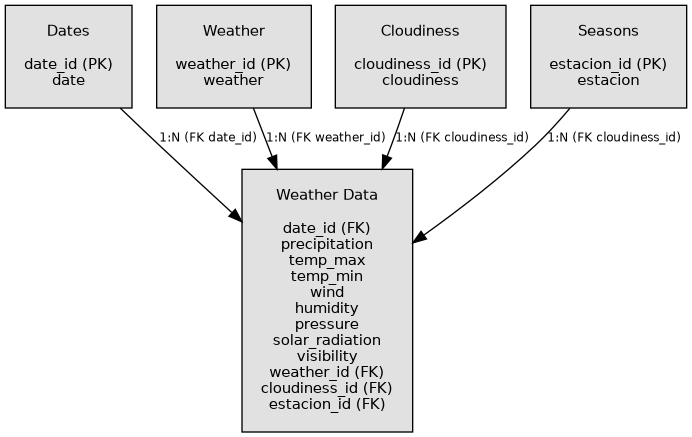

In [143]:
from graphviz import Digraph
from IPython.display import Image

# Crear un nuevo objeto Digraph
dot = Digraph()

# Establecer propiedades de estilo global
dot.attr('node', shape='box', style='filled', fillcolor='#E1E1E1', fontname='Helvetica', margin='0.2,0.2')
dot.attr('edge', fontname='Helvetica')

# Agregar nodos con nombres de tablas y atributos
dot.node('A', 'Dates\n\ndate_id (PK)\ndate',
         margin='0.2,0.2', fontsize='11')  # Título de la tabla más grande
dot.node('B', 'Weather\n\nweather_id (PK)\nweather',
         margin='0.2,0.2', fontsize='11')
dot.node('C', 'Cloudiness\n\ncloudiness_id (PK)\ncloudiness',
         margin='0.2,0.2', fontsize='11')
dot.node('D', 'Seasons\n\nestacion_id (PK)\nestacion',
         margin='0.2,0.2', fontsize='11')
dot.node('E', 'Weather Data\n\ndate_id (FK)\nprecipitation\ntemp_max\ntemp_min\nwind\nhumidity\npressure\nsolar_radiation\nvisibility\nweather_id (FK)\ncloudiness_id (FK)\nestacion_id (FK)',
         margin='0.2,0.2', fontsize='11')

# Agregar relaciones con etiquetas al lado de las tablas
dot.edge('A', 'E', label='1:N (FK date_id)', fontsize='9')  # Dates -> Weather Data
dot.edge('B', 'E', label='1:N (FK weather_id)', fontsize='9')  # Weather -> Weather Data
dot.edge('C', 'E', label='1:N (FK cloudiness_id)', fontsize='9')  # Cloudiness -> Weather Data
dot.edge('D', 'E', label='1:N (FK cloudiness_id)', fontsize='9')  # Cloudiness -> Weather Data

# Configuración de visualización
dot.attr(rankdir='TB')  # Direccional de arriba a abajo
dot.attr(size='11,11')  # Tamaño de la imagen
dot.attr('node', margin='0.5')  # Aumentar el margen entre las tablas

# Renderizar el esquema y mostrarlo en el cuaderno
output_path = 'weather_database_schema'
dot.render(output_path, format='png', cleanup=True)  # Guarda como PNG

# Mostrar la imagen generada
Image(filename=output_path + '.png')


         date  precipitation
0  2016-01-01      44.599483
1  2016-01-02      42.005045
2  2016-01-03      40.041807
3  2016-01-04      11.733310
4  2016-01-05      28.093321


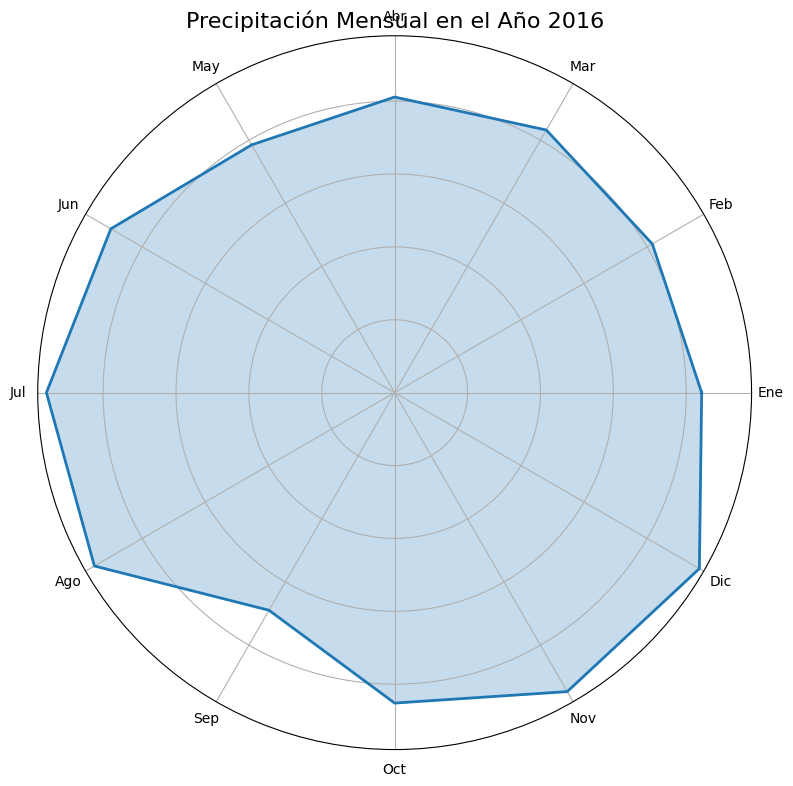

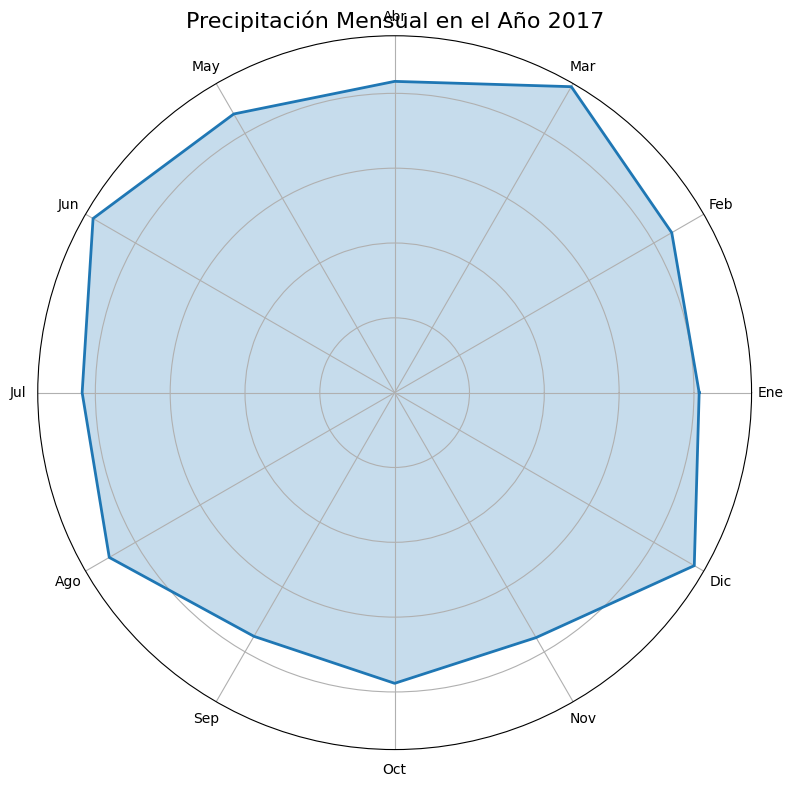

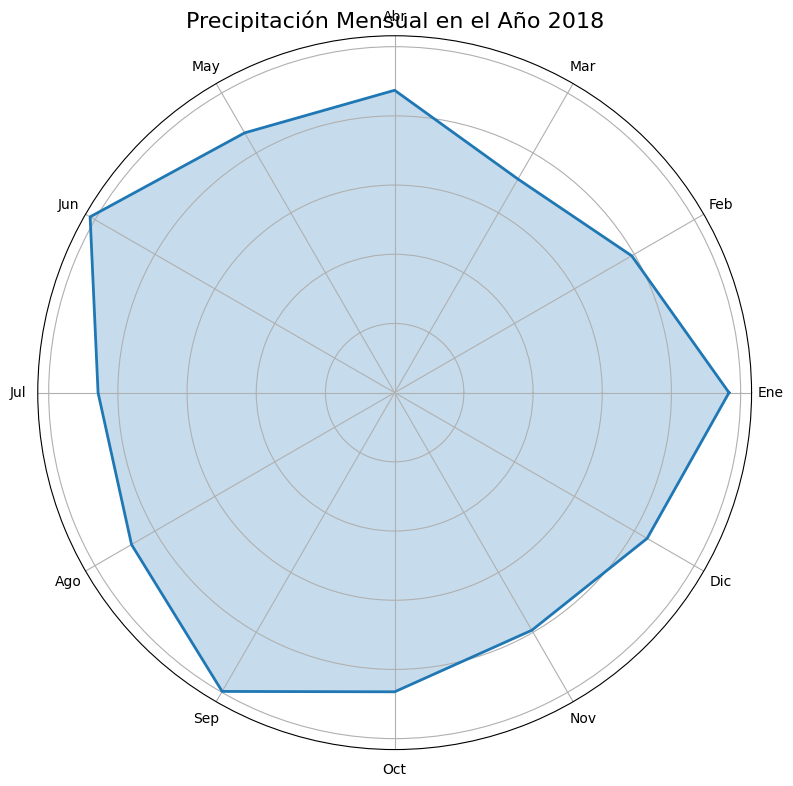

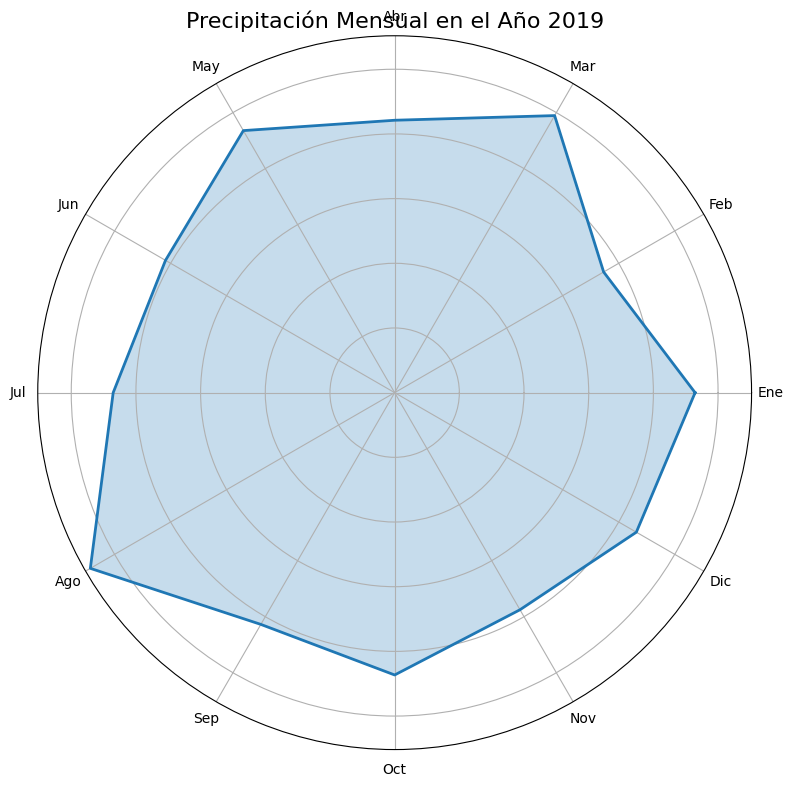

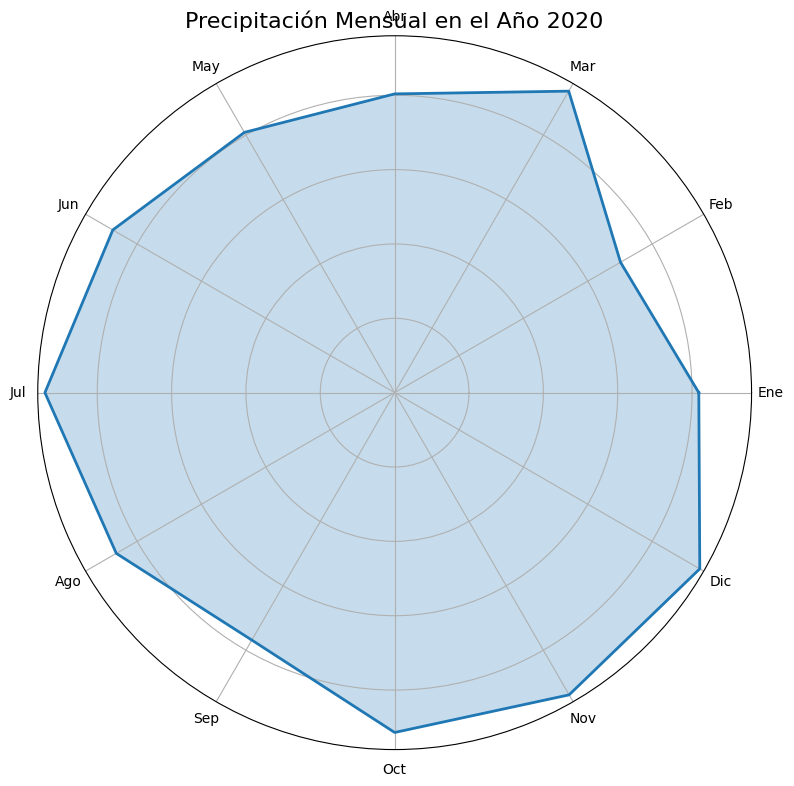

...

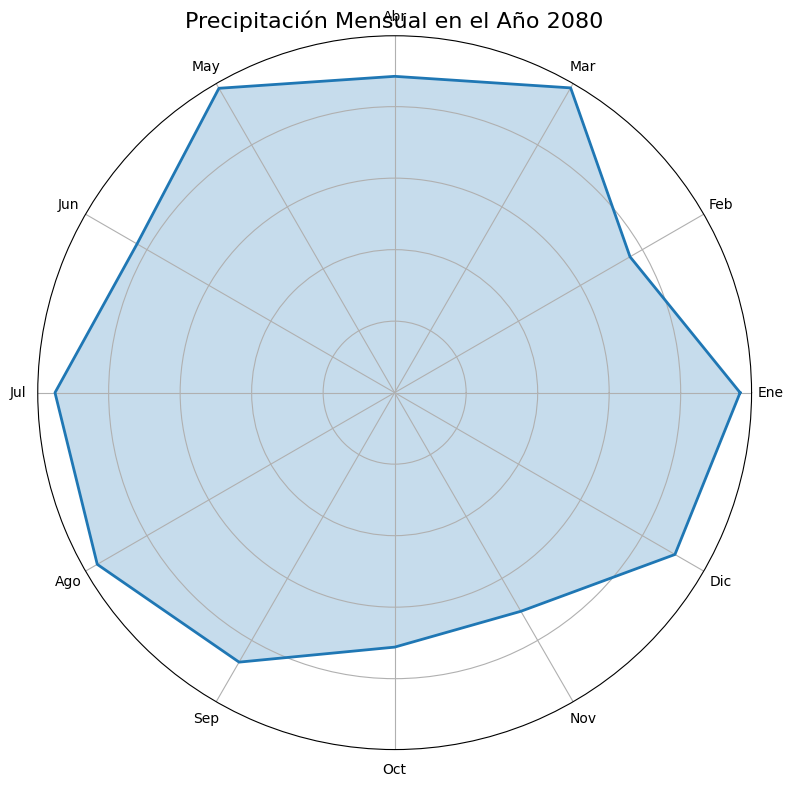

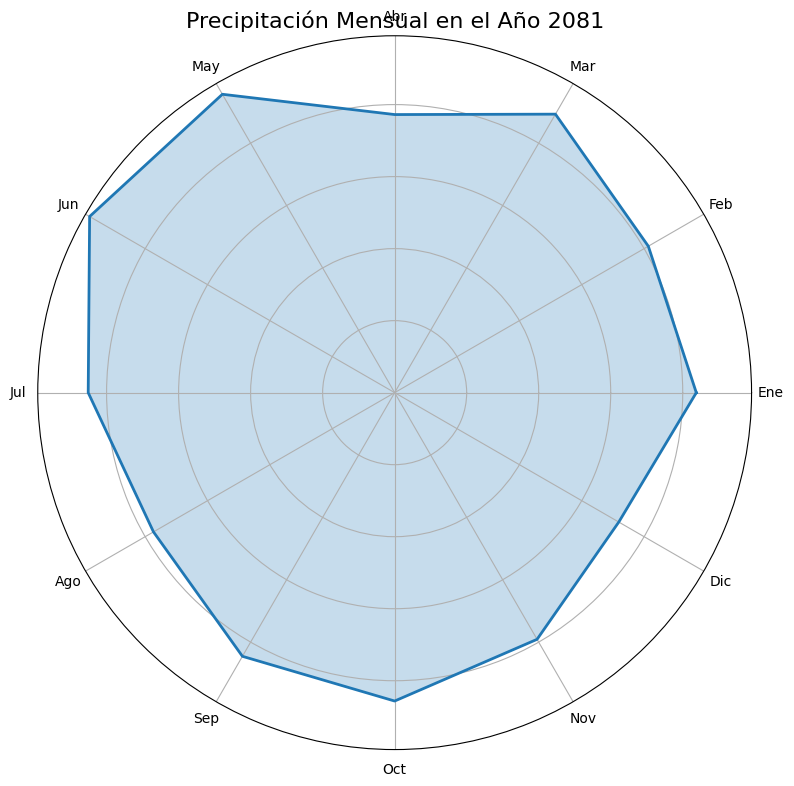

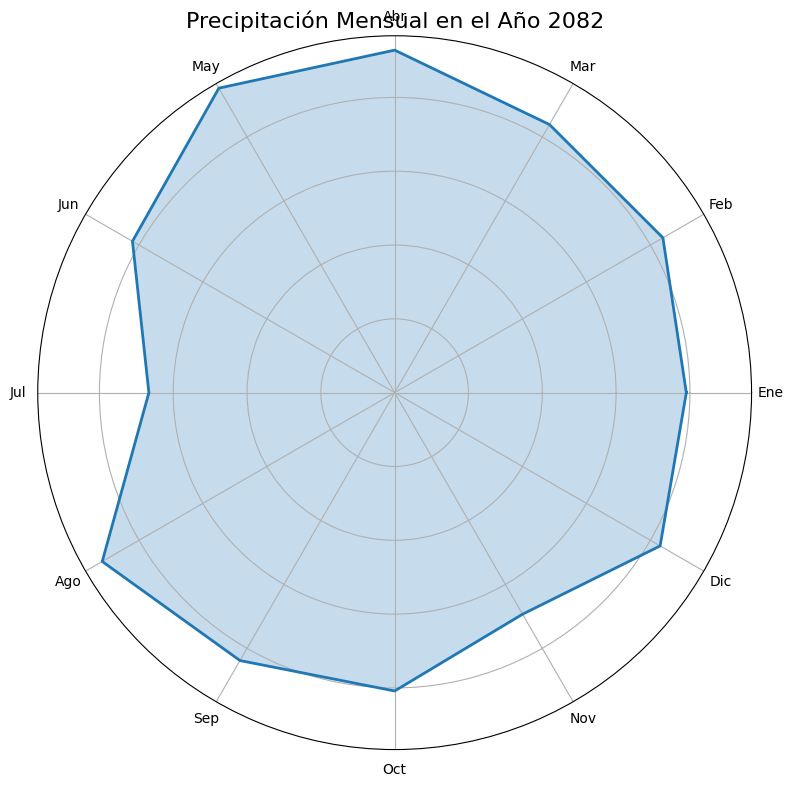

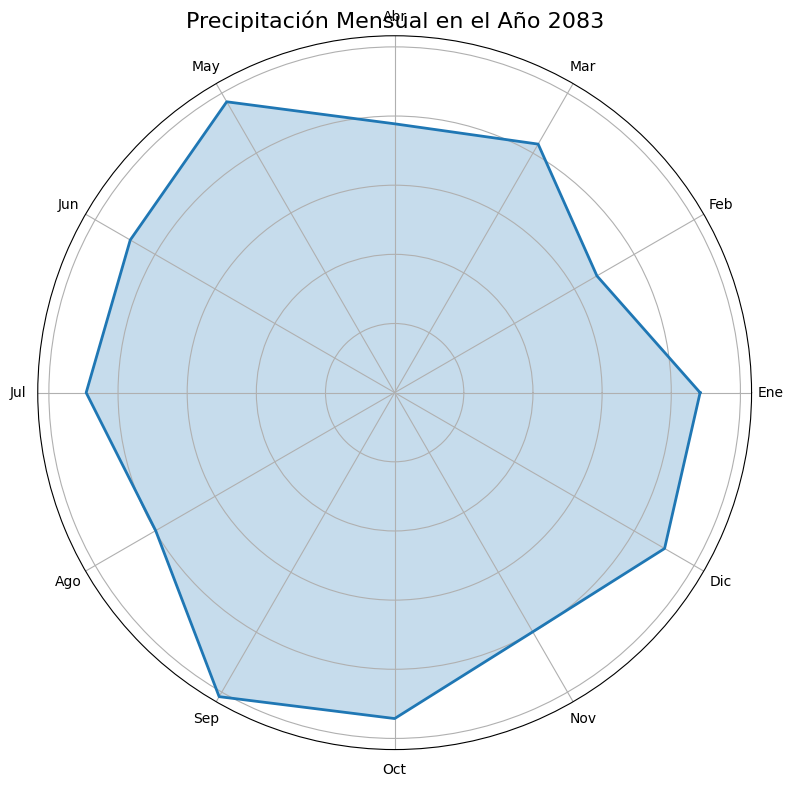

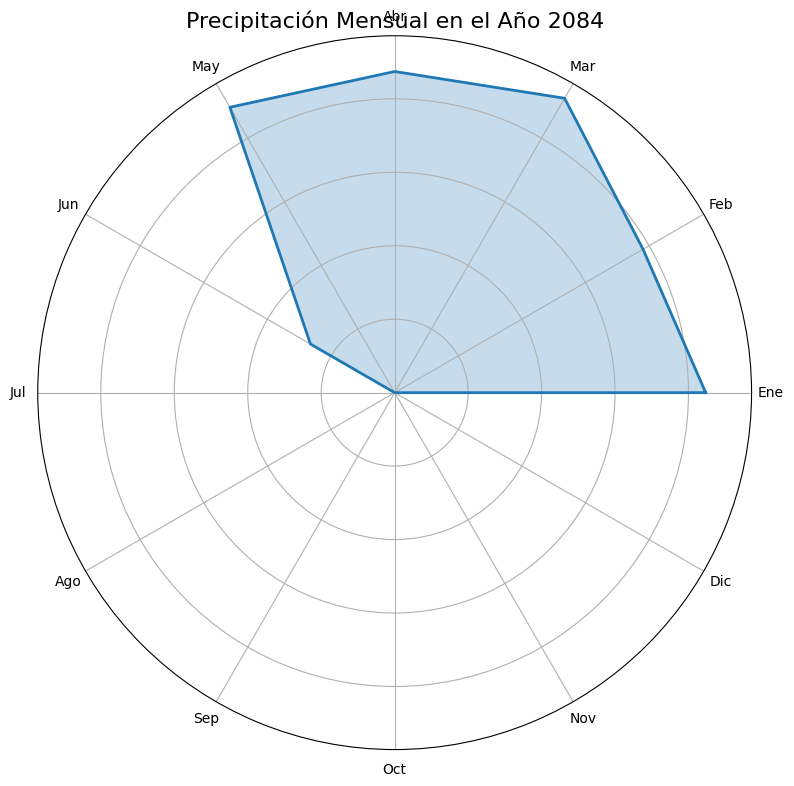

In [ ]:
# Conectar a la base de datos SQLite
#Álvaro
db_path = 'observations.db'

#Google Colab
db_path = '/content/drive/MyDrive/Master IA/Big_data/Proyecto3/observations.db'  # Base de datos unificada
conn = sqlite3.connect(db_path)

try:
    # Consulta para obtener la precipitación y la fecha
    query = """
    SELECT d.date, wd.precipitation
    FROM weather_data wd
    JOIN dates d ON wd.date_id = d.date_id
    ORDER BY d.date
    """
    # Ejecutar la consulta y cargar los resultados en un DataFrame
    weather_data = pd.read_sql_query(query, conn)

finally:
    # Cerrar la conexión
    conn.close()

# Verificar que los datos se han cargado correctamente
print(weather_data.head())

# Convertir la columna 'date' a tipo datetime para poder hacer manipulaciones en las fechas
weather_data['date'] = pd.to_datetime(weather_data['date'])

# Extraer el año y el mes de la columna 'date'
weather_data['year'] = weather_data['date'].dt.year
weather_data['month'] = weather_data['date'].dt.month

# Agrupar por año y mes, y obtener la precipitación total para cada mes
monthly_precipitation = weather_data.groupby(['year', 'month'])['precipitation'].sum().unstack(fill_value=0)

# Crear un gráfico radar por año
years = monthly_precipitation.index

for year in years:
    # Crear el gráfico radar
    categories = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']
    values = monthly_precipitation.loc[year].values

    # Añadir el primer valor al final para cerrar el gráfico
    values = np.concatenate((values, [values[0]]))

    # Establecer el ángulo para cada categoría
    angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()

    # Añadir el primer ángulo al final para cerrar el gráfico
    angles += angles[:1]

    # Crear la figura
    plt.figure(figsize=(8, 8))
    ax = plt.subplot(111, polar=True)

    # Dibujar el gráfico radar
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=f'Año {year}')

    # Rellenar el área
    ax.fill(angles, values, alpha=0.25)

    # Configurar los ángulos y etiquetas
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])  # No mostrar el ángulo adicional
    ax.set_xticklabels(categories, fontsize=10)

    # Título del gráfico
    ax.set_title(f'Precipitación Mensual en el Año {year}', size=16)

    # Mostrar el gráfico
    plt.tight_layout()
    plt.show()

weather  cloudy  fog  rain  storm  sun
season                                
Fall       1485   97  2323   2254   29
Spring     1481  109  2372   2357   29
Summer     1477  114  2455   2204   17
Winter     1454  121  2318   2269   35


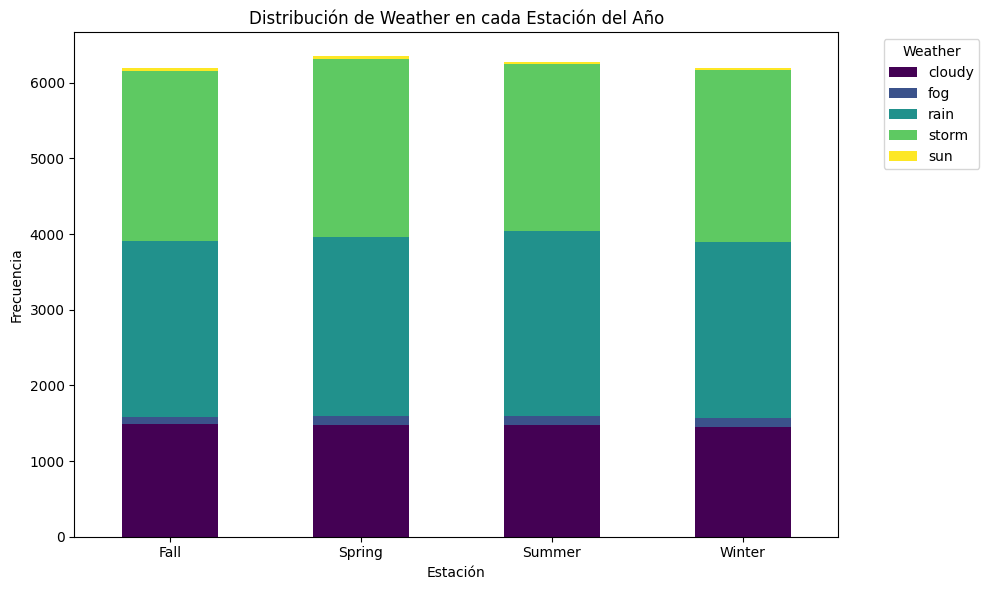

In [ ]:

# Convertir la columna 'date' a tipo datetime en el DataFrame de fechas
df_dates['date'] = pd.to_datetime(df_dates['date'])

# Función para asignar estaciones del año en base al mes
def assign_season(date):
    month = date.month
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'

# Asignar la estación a cada fecha
df_dates['season'] = df_dates['date'].apply(assign_season)

# Unir las tablas usando 'date_id' para incluir la estación en las observaciones
merged_df = df_observations.merge(df_dates[['date_id', 'season']], on='date_id', how='left')

# Unir también el DataFrame de weather para obtener los nombres descriptivos
merged_df = merged_df.merge(df_weather[['weather_id', 'weather']], on='weather_id', how='left')

# Crear una tabla de frecuencias para 'weather' en cada estación
weather_season_distribution = merged_df.groupby(['season', 'weather']).size().unstack()

# Mostrar la distribución
print(weather_season_distribution)

#Hacer un gráfico de lo anterior
# Gráfico de barras apiladas para la distribución de clima por estación
weather_season_distribution.plot(kind='bar', stacked=True, figsize=(10, 6), colormap="viridis")

# Configuraciones del gráfico
plt.title('Distribución de Weather en cada Estación del Año')
plt.xlabel('Estación')
plt.ylabel('Frecuencia')
plt.legend(title='Weather', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)
plt.tight_layout()  # Ajusta el diseño para evitar recortes

# Mostrar el gráfico
plt.show()

         date  precipitation   humidity      wind   temp_max   temp_min  \
0  2016-01-01      44.599483  72.164838  6.343068  24.623334  14.194788   
1  2016-01-02      42.005045  61.847605  1.965057   5.424691   4.754055   
2  2016-01-03      40.041807  70.867155  8.278839   4.626002   2.752717   
3  2016-01-04      11.733310  82.692741  4.369015  33.900703  15.585794   
4  2016-01-05      28.093321  93.495408  4.931801  16.892393   2.735743   

      pressure  solar_radiation  visibility  
0  1047.159266       355.719260    2.554031  
1  1015.712275       320.128520   16.960026  
2  1032.346048       206.294226    5.264422  
3  1018.328973       340.829562    1.650444  
4  1040.779759      1171.100262    5.274300  


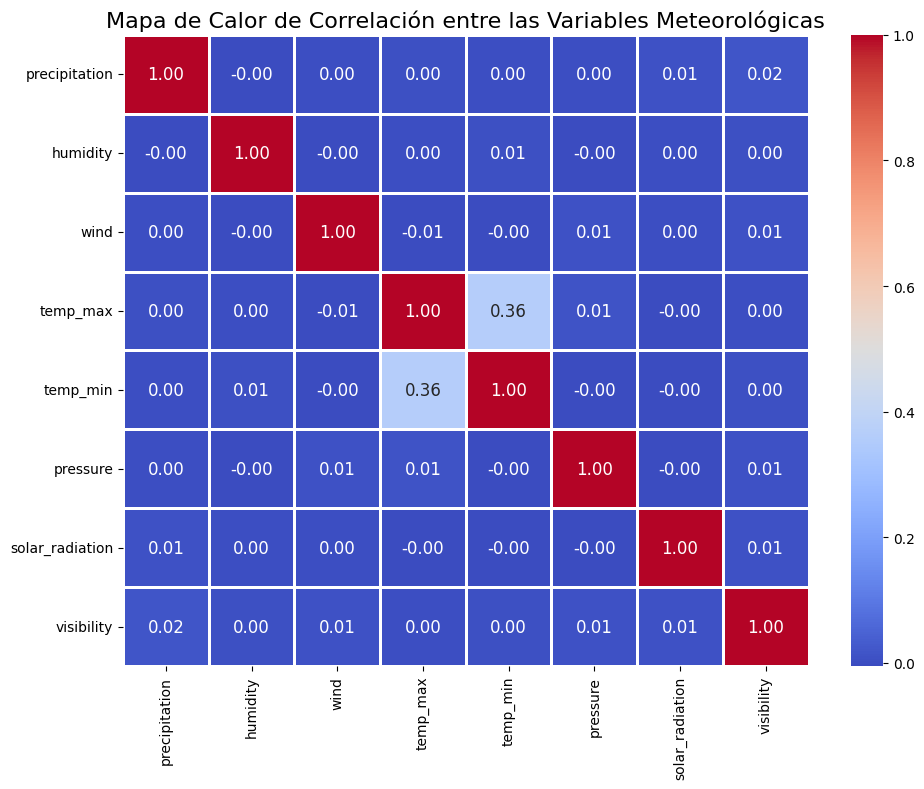

In [ ]:

# Conectar a la base de datos SQLite
#Álvaro
db_path = 'observations.db'

#Google Colab
db_path = '/content/drive/MyDrive/Master IA/Big_data/Proyecto3/observations.db'  # Base de datos unificada
conn = sqlite3.connect(db_path)

try:
    # Consulta para obtener todas las variables relevantes
    query = """
    SELECT d.date, wd.precipitation, wd.humidity, wd.wind, wd.temp_max, wd.temp_min, wd.pressure, wd.solar_radiation, wd.visibility
    FROM weather_data wd
    JOIN dates d ON wd.date_id = d.date_id
    ORDER BY d.date
    """
    # Ejecutar la consulta y cargar los resultados en un DataFrame
    weather_data = pd.read_sql_query(query, conn)

finally:
    # Cerrar la conexión
    conn.close()

# Verificar que los datos se han cargado correctamente
print(weather_data.head())

# Convertir la columna 'date' a tipo datetime para poder hacer manipulaciones en las fechas
weather_data['date'] = pd.to_datetime(weather_data['date'])

# Asegurarse de que las columnas numéricas sean de tipo float (si es necesario)
weather_data[['precipitation', 'humidity', 'wind', 'temp_max', 'temp_min', 'pressure', 'solar_radiation', 'visibility']] = weather_data[['precipitation', 'humidity', 'wind', 'temp_max', 'temp_min', 'pressure', 'solar_radiation', 'visibility']].astype(float)

# Calcular la matriz de correlación
correlation_matrix = weather_data[['precipitation', 'humidity', 'wind', 'temp_max', 'temp_min', 'pressure', 'solar_radiation', 'visibility']].corr()

# Crear el heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', cbar=True, linewidths=1, fmt='.2f', annot_kws={"size": 12})

# Título del gráfico
plt.title('Mapa de Calor de Correlación entre las Variables Meteorológicas', size=16)

# Mejorar la presentación
plt.tight_layout()
plt.show()

         date  precipitation   humidity      wind   temp_max   temp_min  \
0  2016-01-01      44.599483  72.164838  6.343068  24.623334  14.194788   
1  2016-01-02      42.005045  61.847605  1.965057   5.424691   4.754055   
2  2016-01-03      40.041807  70.867155  8.278839   4.626002   2.752717   
3  2016-01-04      11.733310  82.692741  4.369015  33.900703  15.585794   
4  2016-01-05      28.093321  93.495408  4.931801  16.892393   2.735743   

      pressure  solar_radiation  visibility weather            cloudiness  \
0  1047.159266       355.719260    2.554031   storm  parcialmente nublado   
1  1015.712275       320.128520   16.960026    rain  parcialmente nublado   
2  1032.346048       206.294226    5.264422   storm  parcialmente nublado   
3  1018.328973       340.829562    1.650444    rain  parcialmente nublado   
4  1040.779759      1171.100262    5.274300  cloudy             despejado   

   estacion  
0  Invierno  
1  Invierno  
2  Invierno  
3  Invierno  
4  Invierno  


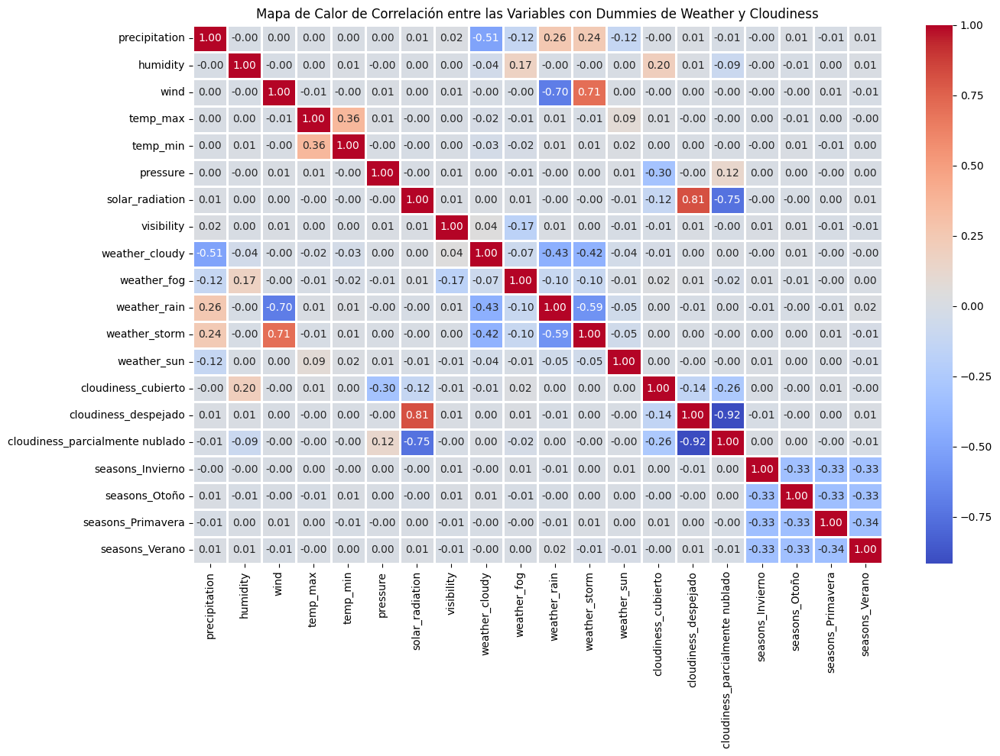

In [ ]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Conectar a la base de datos SQLite
#Álvaro
db_path = 'observations.db'

#Google Colab
db_path = '/content/drive/MyDrive/Master IA/Big_data/Proyecto3/observations.db'  # Base de datos unificada
conn = sqlite3.connect(db_path)

try:
    # Consulta para obtener los datos de `weather_data`, `weather`, y `cloudiness`
    query = """
    SELECT d.date,
           wd.precipitation, wd.humidity, wd.wind, wd.temp_max, wd.temp_min, wd.pressure,
           wd.solar_radiation, wd.visibility, w.weather, c.cloudiness, s.estacion
    FROM weather_data wd
    JOIN dates d ON wd.date_id = d.date_id
    JOIN weather w ON wd.weather_id = w.weather_id
    JOIN cloudiness c ON wd.cloudiness_id = c.cloudiness_id
    JOIN seasons s ON wd.estacion_id = s.estacion_id
    ORDER BY d.date
    """
    # Ejecutar la consulta y cargar los resultados en un DataFrame
    weather_data = pd.read_sql_query(query, conn)

finally:
    # Cerrar la conexión
    conn.close()

# Verificar que los datos se han cargado correctamente
print(weather_data.head())

# Convertir la columna 'date' a tipo datetime
weather_data['date'] = pd.to_datetime(weather_data['date'])

# Asegurarse de que las columnas numéricas sean de tipo float
weather_data[['precipitation', 'humidity', 'wind', 'temp_max', 'temp_min', 'pressure',
              'solar_radiation', 'visibility']] = weather_data[['precipitation', 'humidity',
                                                               'wind', 'temp_max', 'temp_min',
                                                               'pressure', 'solar_radiation',
                                                               'visibility']].astype(float)

# Crear variables dummies para las columnas 'weather' y 'cloudiness'
weather_dummies = pd.get_dummies(weather_data['weather'], prefix='weather').astype(int)
cloudiness_dummies = pd.get_dummies(weather_data['cloudiness'], prefix='cloudiness').astype(int)
seasons_dummies = pd.get_dummies(weather_data['estacion'], prefix='seasons').astype(int)

# Unir las dummies al DataFrame original
weather_data = pd.concat([weather_data, weather_dummies, cloudiness_dummies, seasons_dummies], axis=1)

# Filtrar solo las columnas numéricas para calcular la correlación
numerical_columns = weather_data.select_dtypes(include=['float64', 'int64']).columns

# Calcular la correlación solo entre las columnas numéricas
correlation = weather_data[numerical_columns].corr()

# Configuración del gráfico
plt.figure(figsize=(14, 10))
sns.heatmap(correlation, annot=True, cmap='coolwarm', cbar=True, linewidths=1, fmt='.2f')
plt.title('Mapa de Calor de Correlación entre las Variables con Dummies de Weather y Cloudiness')
plt.tight_layout()
plt.show()


In [ ]:
# Conectar a la base de datos SQLite
#Álvaro
db_path = 'observations.db'

#Google Colab
db_path = '/content/drive/MyDrive/Master IA/Big_data/Proyecto3/observations.db'  # Base de datos unificada
conn = sqlite3.connect(db_path)

try:
    # Consulta para obtener las variables necesarias, excluyendo solar_radiation y pressure, e incluyendo cloudiness
    query = """
    SELECT d.date, wd.temp_max, wd.temp_min, wd.humidity, wd.precipitation, wd.wind, w.weather, c.cloudiness, s.estacion
    FROM weather_data wd
    JOIN dates d ON wd.date_id = d.date_id
    JOIN weather w ON wd.weather_id = w.weather_id
    JOIN cloudiness c ON wd.cloudiness_id = c.cloudiness_id
    JOIN seasons s ON wd.estacion_id = s.estacion_id
    """
    # Ejecutar la consulta y cargar los resultados en un DataFrame
    weather_data = pd.read_sql_query(query, conn)

finally:
    # Cerrar la conexión
    conn.close()

# Verificar que los datos se han cargado correctamente
# print(weather_data.head())

# Convertir la columna 'date' a tipo datetime
weather_data['date'] = pd.to_datetime(weather_data['date'])

# Crear variables dummies para 'weather' y 'cloudiness'
weather_data = pd.get_dummies(weather_data, columns=['weather', 'cloudiness', 'estacion'], drop_first=True)
print(weather_data.head())

# # Separar las características (X) y el objetivo (y) - todas las columnas 'weather_' son el objetivo
# X = weather_data.drop(['date'], axis=1).drop(columns=[col for col in weather_data if 'weather_' in col])
# y = weather_data[[col for col in weather_data.columns if 'weather_' in col]]

# # Dividir los datos en conjunto de entrenamiento y prueba
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Imprimimos los tamaños de los conjuntos
# print("Tamaño del conjunto de entrenamiento:", X_train.shape)
# print("Tamaño del conjunto de prueba:", X_test.shape)

        date   temp_max   temp_min   humidity  precipitation      wind  \
0 2016-01-01  24.623334  14.194788  72.164838      44.599483  6.343068   
1 2016-01-02   5.424691   4.754055  61.847605      42.005045  1.965057   
2 2016-01-03   4.626002   2.752717  70.867155      40.041807  8.278839   
3 2016-01-04  33.900703  15.585794  82.692741      11.733310  4.369015   
4 2016-01-05  16.892393   2.735743  93.495408      28.093321  4.931801   

   weather_fog  weather_rain  weather_storm  weather_sun  \
0        False         False           True        False   
1        False          True          False        False   
2        False         False           True        False   
3        False          True          False        False   
4        False         False          False        False   

   cloudiness_despejado  cloudiness_parcialmente nublado  estacion_Otoño  \
0                 False                             True           False   
1                 False                   

In [258]:

from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.multioutput import MultiOutputClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# Definir los kernels a probar
kernels = ['linear', 'poly', 'rbf', 'sigmoid']

# Resultados para cada kernel
results = {}

# Suponiendo que tu dataframe es 'weather_data'
# Separar características (X) y objetivo (y)
X = weather_data.drop(columns=['date', 'weather_fog', 'weather_rain', 'weather_storm', 'weather_sun'])  # Características
y = weather_data[['weather_fog', 'weather_rain', 'weather_storm', 'weather_sun']]  # Etiquetas multietiqueta

# Dividir datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalización de las características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convertir `y_train` a formato NumPy
y_train_np = y_train.to_numpy()

# Aplicar SMOTE para balancear las clases
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train_np)

# Convertir de nuevo `y_train_resampled` a DataFrame
y_train_resampled = pd.DataFrame(y_train_resampled, columns=y.columns)

# Reducción de dimensionalidad con PCA
pca = PCA(n_components=0.95)  # Retener el 95% de la varianza
X_train_pca = pca.fit_transform(X_train_resampled)
X_test_pca = pca.transform(X_test_scaled)

# Probar cada kernel
for kernel in kernels:
    print(f"\nEvaluando con kernel: {kernel}")
    clf = MultiOutputClassifier(SVC(kernel=kernel, random_state=42))
    clf.fit(X_train_pca, y_train_resampled)

    # Hacer predicciones en el conjunto de prueba
    y_pred = clf.predict(X_test_pca)

    # Convertir las predicciones a DataFrame
    y_pred_df = pd.DataFrame(y_pred, columns=y.columns)

    # Evaluar el modelo
    kernel_results = {}
    for i, col in enumerate(y.columns):
        report = classification_report(y_test.iloc[:, i], y_pred_df.iloc[:, i], output_dict=True)
        kernel_results[col] = report
        print(f"\nEvaluación para {col} con kernel {kernel}:")
        print(classification_report(y_test.iloc[:, i], y_pred_df.iloc[:, i]))

    results[kernel] = kernel_results

results



Evaluando con kernel: linear


/home/alvaro/Escritorio/Prediccion_Tiempo/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/alvaro/Escritorio/Prediccion_Tiempo/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/alvaro/Escritorio/Prediccion_Tiempo/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av


Evaluación para weather_fog con kernel linear:
              precision    recall  f1-score   support

       False       0.98      1.00      0.99      4913
        True       0.00      0.00      0.00        87

    accuracy                           0.98      5000
   macro avg       0.49      0.50      0.50      5000
weighted avg       0.97      0.98      0.97      5000


Evaluación para weather_rain con kernel linear:
              precision    recall  f1-score   support

       False       0.87      0.93      0.90      3062
        True       0.88      0.77      0.82      1938

    accuracy                           0.87      5000
   macro avg       0.87      0.85      0.86      5000
weighted avg       0.87      0.87      0.87      5000


Evaluación para weather_storm con kernel linear:
              precision    recall  f1-score   support

       False       0.87      0.94      0.91      3209
        True       0.87      0.76      0.81      1791

    accuracy                       

{'linear': {'weather_fog': {'False': {'precision': 0.9826,
    'recall': 1.0,
    'f1-score': 0.9912236457177444,
    'support': 4913.0},
   'True': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 87.0},
   'accuracy': 0.9826,
   'macro avg': {'precision': 0.4913,
    'recall': 0.5,
    'f1-score': 0.4956118228588722,
    'support': 5000.0},
   'weighted avg': {'precision': 0.9655027599999999,
    'recall': 0.9826,
    'f1-score': 0.9739763542822557,
    'support': 5000.0}},
  'weather_rain': {'False': {'precision': 0.8652503793626707,
    'recall': 0.9310907903331156,
    'f1-score': 0.896963976718578,
    'support': 3062.0},
   'True': {'precision': 0.8762463343108504,
    'recall': 0.7708978328173375,
    'f1-score': 0.8202031292890475,
    'support': 1938.0},
   'accuracy': 0.869,
   'macro avg': {'precision': 0.8707483568367606,
    'recall': 0.8509943115752265,
    'f1-score': 0.8585835530038127,
    'support': 5000.0},
   'weighted avg': {'precision': 0.86951241150

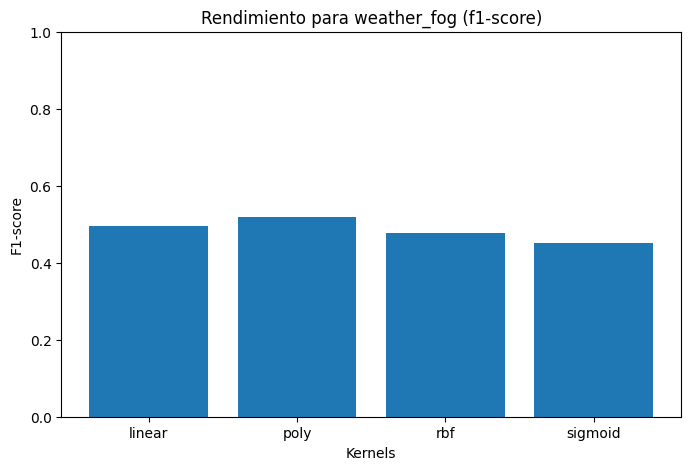

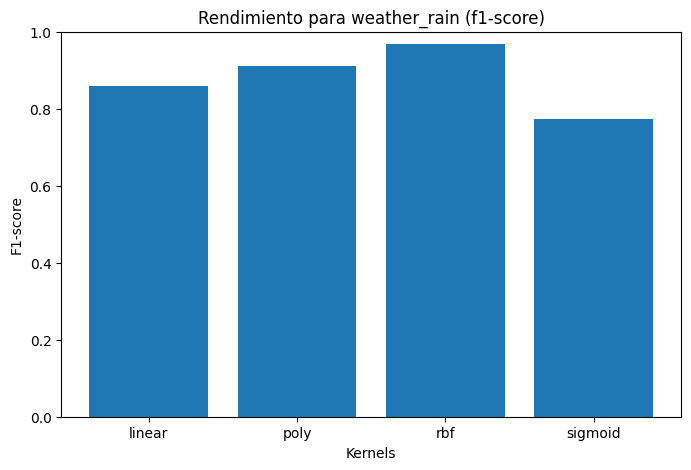

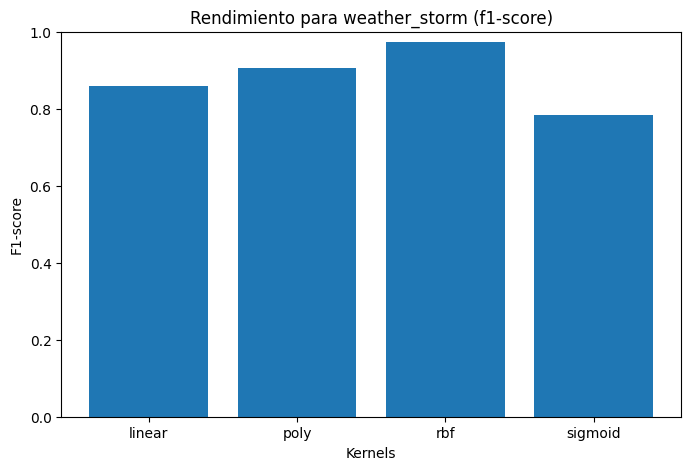

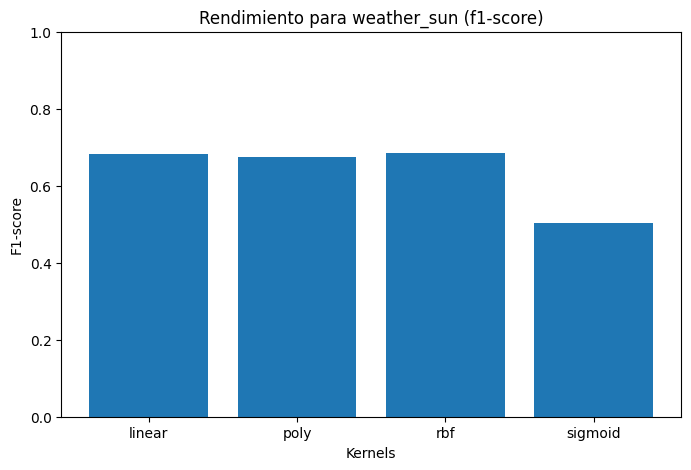

In [259]:
# Función para extraer métricas y graficar resultados por kernel
def plot_metrics(results, metric='f1-score'):
    """
    Visualiza el rendimiento de cada kernel en función de una métrica específica.

    Args:
    - results: Diccionario con resultados de clasificación.
    - metric: Métrica a visualizar (por defecto, 'f1-score').
    """
    kernels = results.keys()
    labels = next(iter(results.values())).keys()  # Etiquetas de las columnas de y

    # Crear un gráfico para cada etiqueta
    for label in labels:
        scores = {kernel: results[kernel][label]['macro avg'][metric] for kernel in kernels}
        plt.figure(figsize=(8, 5))
        plt.bar(scores.keys(), scores.values())
        plt.title(f"Rendimiento para {label} ({metric})")
        plt.xlabel("Kernels")
        plt.ylabel(metric.capitalize())
        plt.ylim(0, 1)
        plt.show()

# Graficar F1-Score para cada kernel y etiqueta
plot_metrics(results, metric='f1-score')

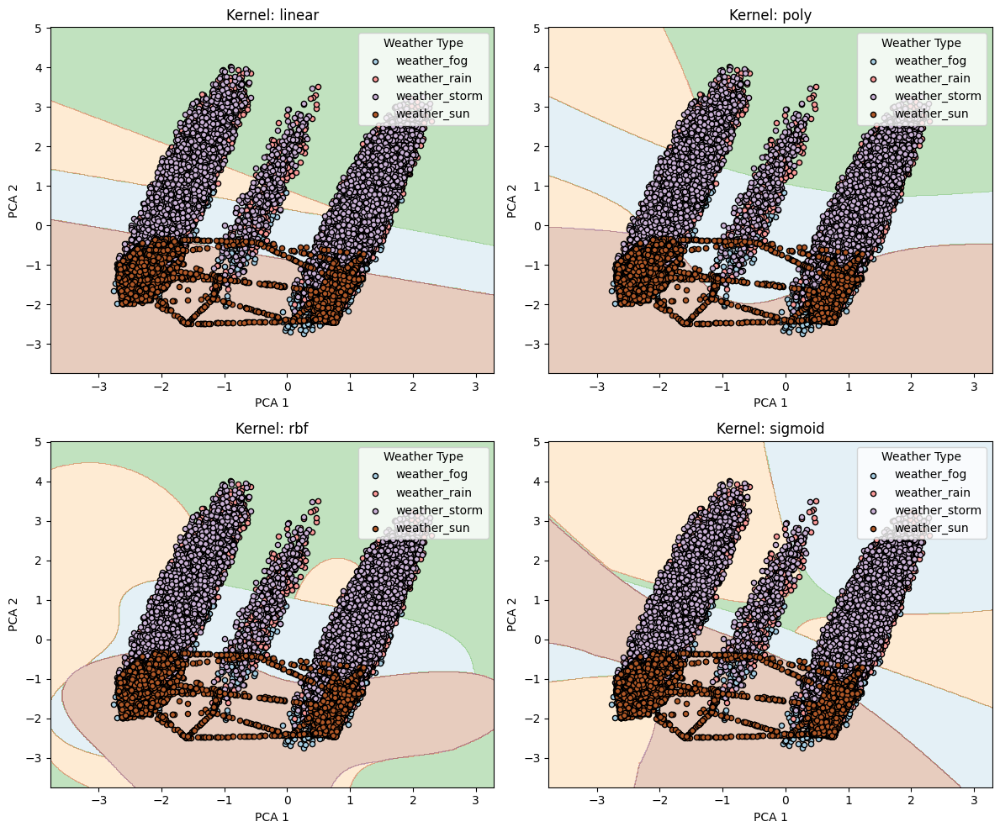

In [261]:
from sklearn.decomposition import PCA
from sklearn.svm import SVC
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Reducir a 2 dimensiones con PCA para visualización
pca_visual = PCA(n_components=2)
X_train_pca_2d = pca_visual.fit_transform(X_train_resampled)
X_test_pca_2d = pca_visual.transform(X_test_scaled)

# Combinar las etiquetas en una sola columna que represente el tipo de clima
y_train_label = y_train_resampled.idxmax(axis=1)  # Tipo de clima predominante por fila
y_test_label = y_test.idxmax(axis=1)

# Convertir las etiquetas a valores numéricos
le = LabelEncoder()
y_train_label_encoded = le.fit_transform(y_train_label)
y_test_label_encoded = le.transform(y_test_label)

# Lista de kernels a probar
kernels = ['linear', 'poly', 'rbf', 'sigmoid']

# Crear una figura para los gráficos
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()

# Etiquetas únicas y colores
unique_labels = le.classes_  # Nombres de las clases
colors = plt.cm.Paired(np.linspace(0, 1, len(unique_labels)))

for i, kernel in enumerate(kernels):
    # Crear y entrenar el modelo
    clf = SVC(kernel=kernel, degree=3, gamma='scale')
    clf.fit(X_train_pca_2d, y_train_label_encoded)

    # Crear una malla para evaluar la función de decisión
    x_min, x_max = X_train_pca_2d[:, 0].min() - 1, X_train_pca_2d[:, 0].max() + 1
    y_min, y_max = X_train_pca_2d[:, 1].min() - 1, X_train_pca_2d[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                         np.linspace(y_min, y_max, 500))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Graficar las regiones de decisión
    ax = axes[i]
    contour = ax.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.Paired)

    # Graficar los datos
    for label, color in zip(unique_labels, colors):
        mask = y_train_label == label
        ax.scatter(X_train_pca_2d[mask, 0], X_train_pca_2d[mask, 1], label=label, color=color, edgecolor='k', s=20)
    ax.set_title(f"Kernel: {kernel}")
    ax.set_xlabel('PCA 1')
    ax.set_ylabel('PCA 2')

    # Añadir leyenda
    ax.legend(title="Weather Type", loc='upper right')

plt.tight_layout()
plt.show()


In [262]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

# Definir el espacio de hiperparámetros
param_grid = {
    'estimator__C': [0.1, 1, 10, 100],
    'estimator__gamma': [1, 0.1, 0.01, 0.001]
}

# Crear un modelo MultiOutputClassifier con SVC (kernel RBF)
base_model = SVC(kernel='rbf', random_state=42)
multi_model = MultiOutputClassifier(base_model)

# Realizar la búsqueda en cuadrícula
grid_search = GridSearchCV(multi_model, param_grid, cv=3, scoring='f1_macro', verbose=2)
grid_search.fit(X_train_pca, y_train_resampled)

# Mostrar los mejores parámetros y su puntuación
print("Mejores parámetros:", grid_search.best_params_)
print("Mejor puntuación:", grid_search.best_score_)


Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV] END ...............estimator__C=0.1, estimator__gamma=1; total time=  16.4s
[CV] END ...............estimator__C=0.1, estimator__gamma=1; total time=  16.6s
[CV] END ...............estimator__C=0.1, estimator__gamma=1; total time=  17.0s
[CV] END .............estimator__C=0.1, estimator__gamma=0.1; total time=   9.6s
[CV] END .............estimator__C=0.1, estimator__gamma=0.1; total time=   9.6s
[CV] END .............estimator__C=0.1, estimator__gamma=0.1; total time=  10.1s
[CV] END ............estimator__C=0.1, estimator__gamma=0.01; total time=  12.6s
[CV] END ............estimator__C=0.1, estimator__gamma=0.01; total time=  12.6s
[CV] END ............estimator__C=0.1, estimator__gamma=0.01; total time=  12.3s
[CV] END ...........estimator__C=0.1, estimator__gamma=0.001; total time=  16.8s
[CV] END ...........estimator__C=0.1, estimator__gamma=0.001; total time=  17.0s
[CV] END ...........estimator__C=0.1, estimator_

/home/alvaro/Escritorio/Prediccion_Tiempo/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END ................estimator__C=10, estimator__gamma=1; total time=  16.1s
[CV] END ..............estimator__C=10, estimator__gamma=0.1; total time=   4.9s
[CV] END ..............estimator__C=10, estimator__gamma=0.1; total time=   4.8s
[CV] END ..............estimator__C=10, estimator__gamma=0.1; total time=   4.6s
[CV] END .............estimator__C=10, estimator__gamma=0.01; total time=   7.4s
[CV] END .............estimator__C=10, estimator__gamma=0.01; total time=   7.4s
[CV] END .............estimator__C=10, estimator__gamma=0.01; total time=   8.2s
[CV] END ............estimator__C=10, estimator__gamma=0.001; total time=  10.0s
[CV] END ............estimator__C=10, estimator__gamma=0.001; total time=   9.9s
[CV] END ............estimator__C=10, estimator__gamma=0.001; total time=  10.3s
[CV] END ...............estimator__C=100, estimator__gamma=1; total time=  14.8s
[CV] END ...............estimator__C=100, estimator__gamma=1; total time=  14.9s


/home/alvaro/Escritorio/Prediccion_Tiempo/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END ...............estimator__C=100, estimator__gamma=1; total time=  15.6s
[CV] END .............estimator__C=100, estimator__gamma=0.1; total time=   6.7s
[CV] END .............estimator__C=100, estimator__gamma=0.1; total time=   6.5s
[CV] END .............estimator__C=100, estimator__gamma=0.1; total time=   6.4s
[CV] END ............estimator__C=100, estimator__gamma=0.01; total time=   7.7s
[CV] END ............estimator__C=100, estimator__gamma=0.01; total time=   8.0s
[CV] END ............estimator__C=100, estimator__gamma=0.01; total time=   7.9s
[CV] END ...........estimator__C=100, estimator__gamma=0.001; total time=   8.8s
[CV] END ...........estimator__C=100, estimator__gamma=0.001; total time=   8.6s
[CV] END ...........estimator__C=100, estimator__gamma=0.001; total time=   9.9s
Mejores parámetros: {'estimator__C': 100, 'estimator__gamma': 0.1}
Mejor puntuación: 0.8179702200092378


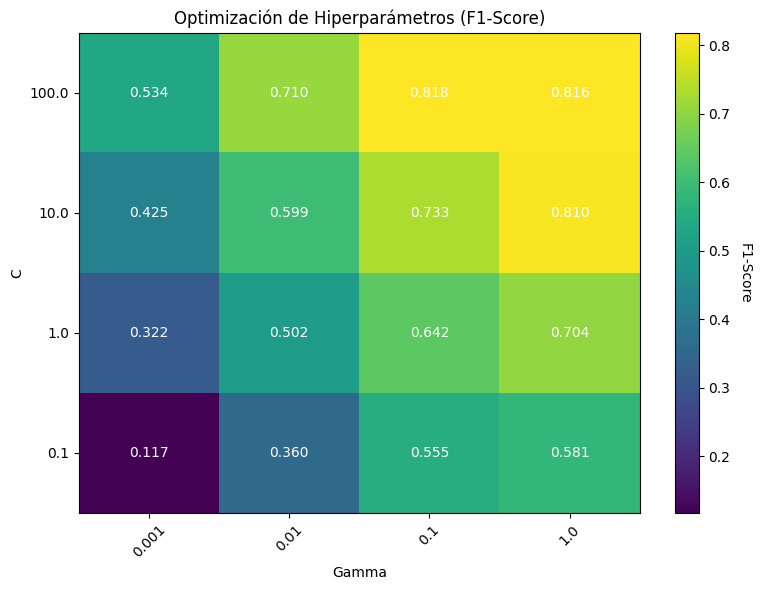

In [265]:
import matplotlib.pyplot as plt
import pandas as pd

# Extraer los resultados de GridSearchCV en un DataFrame
results_df = pd.DataFrame(grid_search.cv_results_)

# Filtrar las columnas relevantes
results_df = results_df[['param_estimator__C', 'param_estimator__gamma', 'mean_test_score']]

# Pivotar los resultados para graficar
pivot_table = results_df.pivot(index='param_estimator__C', columns='param_estimator__gamma', values='mean_test_score')

# Crear el gráfico de calor
plt.figure(figsize=(8, 6))
heatmap = plt.imshow(pivot_table, cmap='viridis', aspect='auto', origin='lower')
cbar = plt.colorbar(heatmap)
cbar.set_label('F1-Score', rotation=270, labelpad=15)

# Etiquetas y título
plt.xticks(range(len(pivot_table.columns)), pivot_table.columns, rotation=45)
plt.yticks(range(len(pivot_table.index)), pivot_table.index)
plt.xlabel('Gamma')
plt.ylabel('C')
plt.title('Optimización de Hiperparámetros (F1-Score)')

# Añadir valores en el gráfico
for i, c_value in enumerate(pivot_table.index):
    for j, gamma_value in enumerate(pivot_table.columns):
        score = pivot_table.iloc[i, j]
        plt.text(j, i, f"{score:.3f}", ha='center', va='center', color="white")

# Mostrar el gráfico
plt.tight_layout()
plt.show()



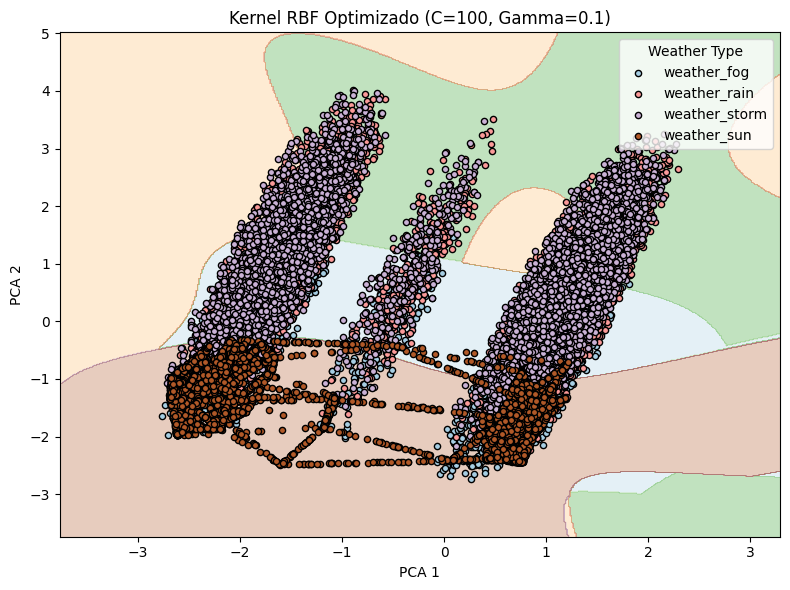

In [266]:
# Visualización del kernel RBF optimizado
from sklearn.decomposition import PCA
from sklearn.svm import SVC
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Reducir a 2 dimensiones con PCA para visualización
pca_visual = PCA(n_components=2)
X_train_pca_2d = pca_visual.fit_transform(X_train_resampled)
X_test_pca_2d = pca_visual.transform(X_test_scaled)

# Combinar las etiquetas en una sola columna que represente el tipo de clima
y_train_label = y_train_resampled.idxmax(axis=1)  # Tipo de clima predominante por fila
y_test_label = y_test.idxmax(axis=1)

# Convertir las etiquetas a valores numéricos
le = LabelEncoder()
y_train_label_encoded = le.fit_transform(y_train_label)
y_test_label_encoded = le.transform(y_test_label)

# Obtener los mejores parámetros del GridSearchCV
best_C = grid_search.best_params_['estimator__C']
best_gamma = grid_search.best_params_['estimator__gamma']

# Entrenar el modelo RBF optimizado
clf_rbf = SVC(kernel='rbf', C=best_C, gamma=best_gamma, random_state=42)
clf_rbf.fit(X_train_pca_2d, y_train_label_encoded)

# Crear una malla para evaluar la función de decisión
x_min, x_max = X_train_pca_2d[:, 0].min() - 1, X_train_pca_2d[:, 0].max() + 1
y_min, y_max = X_train_pca_2d[:, 1].min() - 1, X_train_pca_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                     np.linspace(y_min, y_max, 500))
Z = clf_rbf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Graficar las regiones de decisión
plt.figure(figsize=(8, 6))
contour = plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.Paired)

# Graficar los datos
unique_labels = le.classes_  # Nombres de las clases
colors = plt.cm.Paired(np.linspace(0, 1, len(unique_labels)))
for label, color in zip(unique_labels, colors):
    mask = y_train_label == label
    plt.scatter(X_train_pca_2d[mask, 0], X_train_pca_2d[mask, 1], label=label, color=color, edgecolor='k', s=20)

# Títulos y leyenda
plt.title(f"Kernel RBF Optimizado (C={best_C}, Gamma={best_gamma})")
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend(title="Weather Type", loc='upper right')
plt.tight_layout()
plt.show()
